# Explore Mini Biomass Training Set 
This notebook shows how to load the samples contained in the mini training set for the biomass project.

In [1]:
import matplotlib.pyplot as plt
import polars as ps
import rasterio
import os
from shapely.geometry import box
from shapely.ops import transform
import pyproj
import geopandas as gpd
import numpy as np
import h5py
from rasterio import Affine

In [2]:
# Load data
DATSET_ROOT_DIR = "./"
PATH_DS = os.path.join(DATSET_ROOT_DIR, "mini_training_data.h5")

ds = h5py.File(PATH_DS, "r")
s2_data = ds["samples"]["raster_data"]["Sentinel-2-L2A"]
copdem_data = ds["samples"]["raster_data"]["CopDEM"]
worldcover_data = ds["samples"]["raster_data"]["WorldCover"]
agbd_data = ds["samples"]["raster_data"]["AGBD"]
transform_data = ds["samples"]["metadata"]["Transforms"]
crs_data = ds["samples"]["metadata"]["CRS"]

In [3]:
## Global distibution and statistics
extends = []

f, axs = plt.subplots(1,1, figsize=(100,100), dpi=300)
axs.set_title("Sample locations", fontdict={"fontsize": 36})

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.boundary.plot(ax=axs, facecolor="none", edgecolor="black")

stats_s2 = dict(means=[], stds=[])
stats_copdem = dict(means=[], stds=[])

arr_s2 = [] 
arr_agbd = [] 
arr_copdem = []
arr_wc = []

## Helper funtion to create Rasterio dataset from HDF5 data
def recreate_rasterio_dataset(raster: np.array, count: int, src_transform: np.array, crs: int):
    """Recreates a rasterio dataset from Numpy array, CRS and transform data

    Currently only used to get the dataset bounds, but might be usefukl in the future.

    From: https://gis.stackexchange.com/questions/329434/creating-an-in-memory-rasterio-dataset-from-numpy-array

    Args:
        raster: Array containing the raster data
        count: Number of bands (channels in array)
        src_transform: The transform of the data
        crs: CRS identifier of the data
    """
    a, b, c, d, e, f = list(src_transform[:6])
    _transform = Affine(a, b, c, d, e, f)
    raster = np.squeeze(raster)
    with rasterio.io.MemoryFile() as memfile:
        with memfile.open(
            driver='GTiff',
            height=raster.shape[0],
            width=raster.shape[1],
            count=count,
            dtype=raster.dtype,
            transform=_transform,
        ) as dataset:
            dataset.write(raster, 1)
        with memfile.open() as dataset:
            bounds = dataset.bounds
    return bounds

def reproject_bounds(bounds, src_crs: int):
    geom = box(*bounds)

    wgs84 = pyproj.CRS("EPSG:4326")
    src_crs = pyproj.CRS(f"EPSG:{src_crs}")

    project = pyproj.Transformer.from_crs(src_crs, wgs84, always_xy=True).transform
    wgs_bounds= transform(project, geom)

    return wgs_bounds

for idx in range(len(s2_data)):
    sample_s2 = s2_data[idx,:,:,:]
    sample_cd  = copdem_data[idx,:,:]
    sample_wc  = worldcover_data[idx,:,:]
    sample_agbd  = agbd_data[idx,:,:]
    sample_transform  = transform_data[idx]
    sample_crs = crs_data[idx]

    # Get bounds by recreating a rasterio dataset from the HDF5 data
    bounds = recreate_rasterio_dataset(sample_cd, 1, sample_transform, sample_crs)
    bounds = reproject_bounds(bounds, sample_crs)
    # Plot bounds on world map
    axs.plot(*bounds.exterior.xy, linewidth=50)

    # Sentinel-2
    mean = sample_s2.mean(axis=(1,2))
    std = sample_s2.std(axis=(1,2))
    stats_s2["means"].append(mean)
    stats_s2["stds"].append(std)

    b = sample_s2[0,:,:]
    g = sample_s2[1,:,:]
    red = sample_s2[2,:,:]
    rgb = np.stack([red,g,b],axis=-1)

    arr_s2.append(rgb)

    # CopDEM
    cd_data = np.squeeze(sample_cd)
    cd_mean = cd_data.mean()
    cd_std = cd_data.std()

    stats_copdem["means"].append(cd_mean)
    stats_copdem["stds"].append(cd_std)

    arr_copdem.append(cd_data)

    # WorldCover
    wc_data = np.squeeze(sample_wc)

    arr_wc.append(wc_data)

    # AGBD
    arr_agbd.append(np.squeeze(sample_agbd))


# Compute dataset means and stds
mean_s2 = np.around(np.array(stats_s2["means"]).mean(axis=0), decimals=6)
std_s2 = np.around(np.array(stats_s2["stds"]).mean(axis=0), decimals=6)

mean_copdem = np.around(np.array(stats_copdem["means"]).mean(), decimals=6)
std_copdem = np.around(np.array(stats_copdem["stds"]).mean(), decimals=6)



/var/folders/h5/47bjx_m15098wnx6z2zq2vzm0000gn/T/ipykernel_28262/4064441672.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


In [8]:
s = f"""
Sentinel-2 mean: \t{mean_s2}
Sentinel-2 std:  \t{std_s2}
CopDEM mean:     \t{mean_copdem}
CopDEM std:      \t{std_copdem}""" 

print(s)
idx = 2
for mean, std in zip(list(mean_s2), list(std_s2)):
    print(idx, mean, std)
    idx += 1


Sentinel-2 mean: 	[ 485.351172  750.138223  846.548633 1285.640664 2282.01834  2666.382754
 2768.747754 2942.279375 2928.457266 2457.978281 1589.633516    4.40793 ]
Sentinel-2 std:  	[8.24611840e+01 1.16281203e+02 1.55465934e+02 1.55280409e+02
 2.44467559e+02 2.90221513e+02 3.75659276e+02 3.07422401e+02
 2.11569528e+02 2.53796377e+02 2.04408104e+02 1.14434000e-01]
CopDEM mean:     	697.9570922851562
CopDEM std:      	7.470101833343506
2 485.351172 82.461184
3 750.138223 116.281203
4 846.548633 155.465934
5 1285.640664 155.280409
6 2282.01834 244.467559
7 2666.382754 290.221513
8 2768.747754 375.659276
9 2942.279375 307.422401
10 2928.457266 211.569528
11 2457.978281 253.796377
12 1589.633516 204.408104
13 4.40793 0.114434


## Plot all samples


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

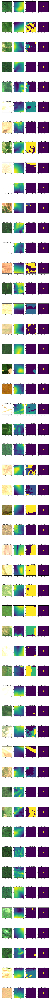

In [18]:
f, axs = plt.subplots(50,4, figsize=(10, 4*50))

vmin = 0
vmax = 3000
ts = 10

for idx in range(50):
    # Sentinel-2
    axs[idx, 0].imshow(arr_s2[idx] / 1e3, vmin=vmin, vmax=vmax)
    # CopDEM
    axs[idx,1].imshow(np.squeeze(arr_copdem[idx]))
    # WorldCover
    axs[idx,2].imshow(np.squeeze(arr_wc[idx]))
    # AGBD
    axs[idx,3].imshow(np.squeeze(arr_agbd[idx]))
    # Set titles
    axs[idx,0].set_title(f"IDX: {idx} - Sentinel-2 RGB", fontdict={"fontsize": ts})
    axs[idx,1].set_title(f"IDX: {idx} - CopDEM", fontdict={"fontsize": ts})
    axs[idx,2].set_title(f"IDX: {idx} - WorldCover", fontdict={"fontsize": ts})
    axs[idx,3].set_title(f"IDX: {idx} - AGBD", fontdict={"fontsize": ts})
    
plt.tight_layout()
